## Exploratory notebook for downloading, processing and viewing Sentinel-2 image tiles

More in depth information on the Sentinel-2 mission can be found here: https://sentinel.esa.int/web/sentinel/missions/sentinel-2

Here are a few key important terms/ details to note:
- BOA: Bottom of Atmosphere
- TOA: Top of Atmosphere 
- L1C: https://sentinels.copernicus.eu/web/sentinel/user-guides/sentinel-2-msi/product-types/level-1c
- L2A: https://sentinels.copernicus.eu/web/sentinel/technical-guides/sentinel-2-msi/level-2a/algorithm
- Sentinel-2 file nameing convention: https://sentinels.copernicus.eu/web/sentinel/user-guides/sentinel-2-msi/naming-convention
- Requester Pays: Means not free and we need to pay for data transfer: https://aws.amazon.com/s3/pricing/?p=pm&c=s3&z=4
- Sentinel-2 on AWS: https://registry.opendata.aws/sentinel-2/
- Sentinel-2 on google cloud: https://cloud.google.com/storage/docs/public-datasets/sentinel-2
- Military Grid Referance System: https://legallandconverter.com/images/usng-cropped-printscreen.jpg
- Google Earth Engine: https://earthengine.google.com/
- gsutil: https://cloud.google.com/storage/docs/gsutil
- Sen2Cor: https://step.esa.int/main/snap-supported-plugins/sen2cor/
- .safe folder: https://sentinels.copernicus.eu/web/sentinel/user-guides/sentinel-2-msi/data-formats
- wildcards: https://en.wikipedia.org/wiki/Glob_(programming)
- NDVI: https://gisgeography.com/ndvi-normalized-difference-vegetation-index/


### Downloading and viewing image tiles

To accomplish this,we have two options, we can download tiles from and AWS S3 (requster pays) bucket, or we can download them from a Google Cloud bucket (Free, but more complicated). I will demonstrate below how to do this from google cloud. We will gsutil which is a command line tool. Although it is a commadn line tool we can still use it in python.

Lets download a image scene that will give us a good view of LA (11SLT) sometime in summer of 2021 so we dont need to think about cloud cover.

We can use the link below to explore through all of our options. It is imporant to note that we are downloading a L2A image scene.

https://console.cloud.google.com/storage/browser/gcp-public-data-sentinel-2

Lets download an image scene that took place during the woolsey fire. This is the folder I want to download, notice it ends with .SAFE:
gcp-public-data-sentinel-2/L2/tiles/11/S/LV/S2A_MSIL2A_20190706T183921_N0212_R070_T11SLV_20190707T000755.SAFE

In [1]:
import os
import xarray as xr
import glob
import numpy as np
import matplotlib.pyplot as plt
from skimage import exposure

In [3]:
#changing working directory so that files download in the example_files folder
%cd example_files

C:\Users\Tom\OneDrive - Cal Poly Pomona\GBA Fires\Code\Satellite Programs\Sentinel-2\example_files


In [3]:
# this will download an image scence (aka .safe folder)
os.system('gsutil -m cp -r "gs://gcp-public-data-sentinel-2/L2/tiles/11/S/LT/S2A_MSIL2A_20190802T182921_N0213_R027_T11SLT_20190802T224247.SAFE/" .')

0

See .safe folder above for information on how our data is organized.
Below we will visualize our data using the xarray libray. Lets first look at the Red, Green and Blue band (2, 3, 4). I will also use glob to help me find specific file using wildcards (*)

In [4]:
#glob example, notice it returns a list, so we want the first value. We can also use regex within glob
glob.glob('*2019*.SAFE\GRANULE\L2A_*\IMG_DATA\R10m\*_B02_*.jp2')

['S2A_MSIL2A_20190802T182921_N0213_R027_T11SLT_20190802T224247.SAFE\\GRANULE\\L2A_T11SLT_A021474_20190802T183856\\IMG_DATA\\R10m\\T11SLT_20190802T182921_B02_10m.jp2']

In [5]:
#band 2: Blue
#band 3: Green
#band 4: Red
#Band 8: NIR
band2 = xr.open_rasterio(glob.glob('*2019*11SLT*.SAFE\GRANULE\L2A_*\IMG_DATA\R10m\*_B02_*.jp2')[0])
band3 = xr.open_rasterio(glob.glob('*2019*11SLT*.SAFE\GRANULE\L2A_*\IMG_DATA\R10m\*_B03_*.jp2')[0])
band4 = xr.open_rasterio(glob.glob('*2019*11SLT*.SAFE\GRANULE\L2A_*\IMG_DATA\R10m\*_B04_*.jp2')[0])

Our xarray is more advanced than a simple array, not only does it include our image data, it also includes the corrdinates.

In [6]:
band2

<xarray.DataArray (band: 1, y: 10980, x: 10980)>
[120560400 values with dtype=uint16]
Coordinates:
  * band     (band) int32 1
  * y        (y) float64 3.8e+06 3.8e+06 3.8e+06 ... 3.69e+06 3.69e+06 3.69e+06
  * x        (x) float64 3e+05 3e+05 3e+05 ... 4.098e+05 4.098e+05 4.098e+05
Attributes:
    transform:   (10.0, 0.0, 300000.0, 0.0, -10.0, 3800040.0)
    crs:         +init=epsg:32611
    res:         (10.0, 10.0)
    is_tiled:    1
    nodatavals:  (nan,)
    scales:      (1.0,)
    offsets:     (0.0,)

Lets view our image for now.

In [7]:
#notice its an array
band2.values

array([[[ 597,  573,  580, ...,  800,  916,  774],
        [ 569,  559,  542, ..., 1070, 1028,  678],
        [ 563,  485,  577, ...,  883,  858,  836],
        ...,
        [4036, 4232, 4384, ...,  210,  192,  195],
        [4052, 4300, 4320, ...,  205,  219,  229],
        [3946, 4184, 4204, ...,  197,  273,  209]]], dtype=uint16)

In [8]:
band2.shape

(1, 10980, 10980)

In [9]:
band2[0].values.shape

(10980, 10980)

In [10]:
band2[0].values

array([[ 597,  573,  580, ...,  800,  916,  774],
       [ 569,  559,  542, ..., 1070, 1028,  678],
       [ 563,  485,  577, ...,  883,  858,  836],
       ...,
       [4036, 4232, 4384, ...,  210,  192,  195],
       [4052, 4300, 4320, ...,  205,  219,  229],
       [3946, 4184, 4204, ...,  197,  273,  209]], dtype=uint16)

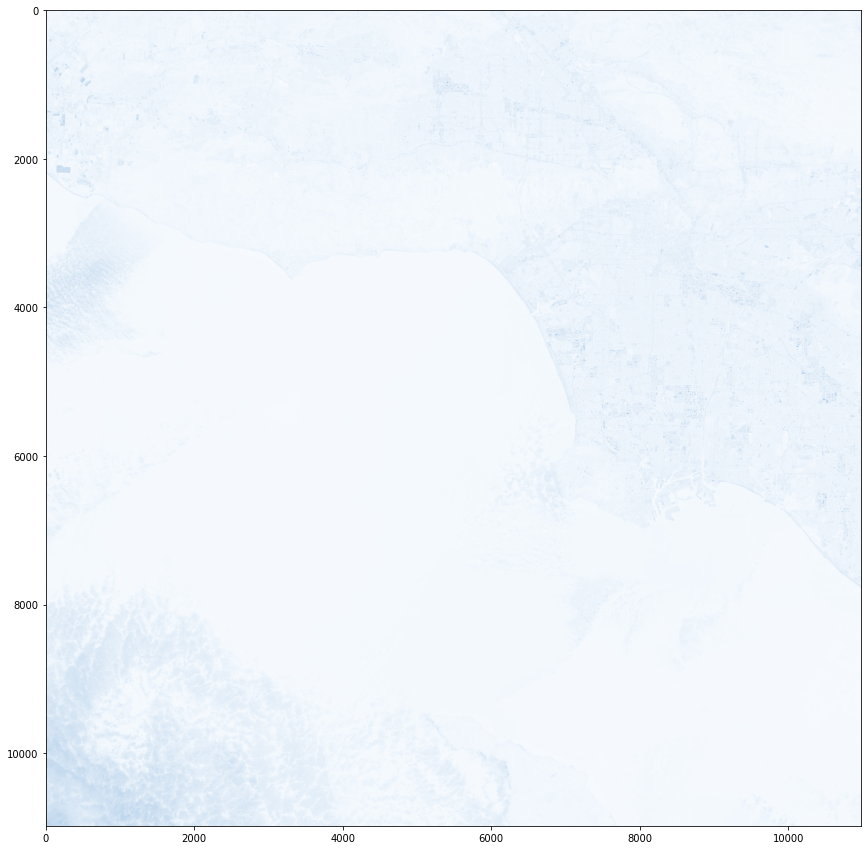

In [11]:
import matplotlib.pyplot as plt 
plt.figure(figsize = (15,15))
plt.imshow(band2[0].values, cmap = 'Blues')

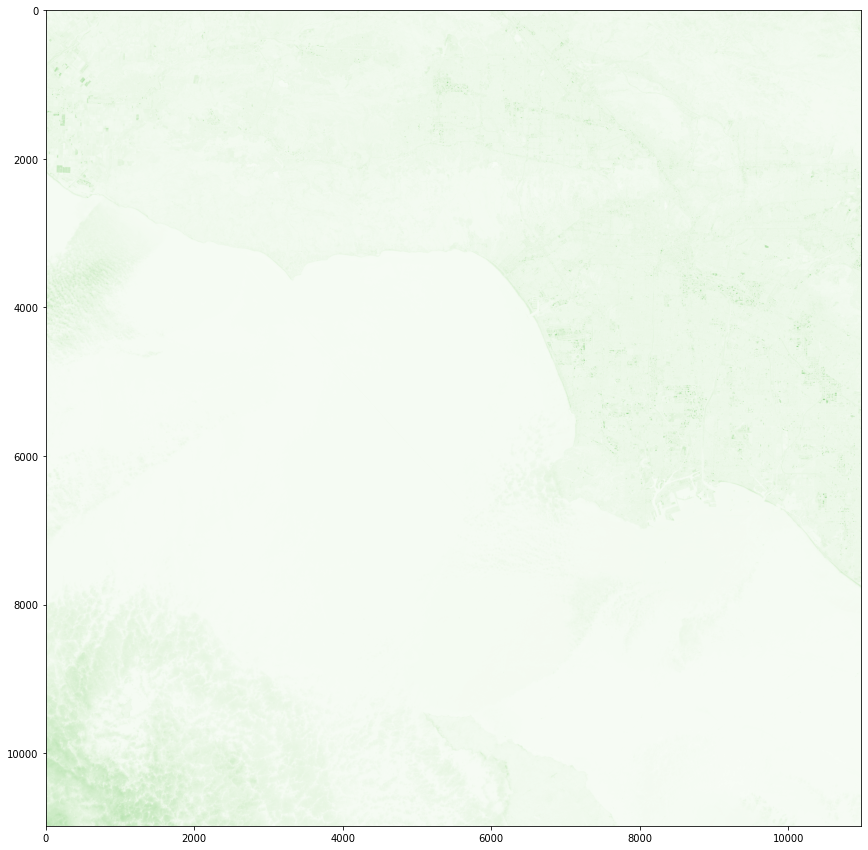

In [12]:
import matplotlib.pyplot as plt 
plt.figure(figsize = (15,15))
plt.imshow(band3[0].values, cmap = 'Greens')

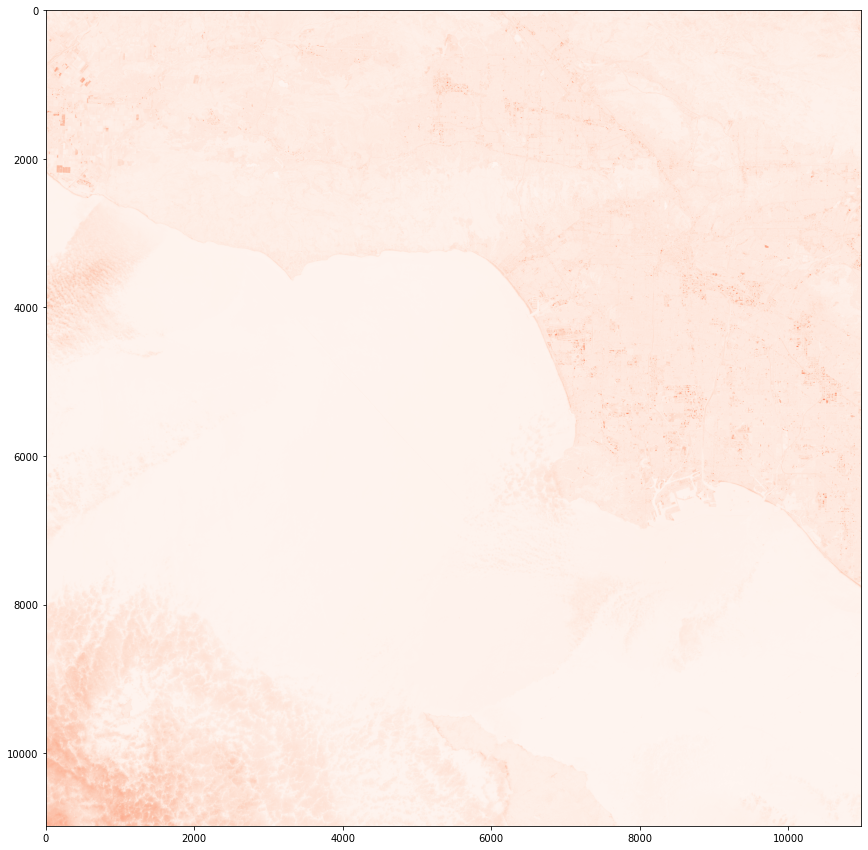

In [13]:
import matplotlib.pyplot as plt 
plt.figure(figsize = (15,15))
plt.imshow(band3[0].values, cmap = 'Reds')

In [14]:
R,G,B = band4[0].values, band3[0].values, band2[0].values

In [15]:
import numpy as np

In [16]:
RGB = np.dstack([R, G, B])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


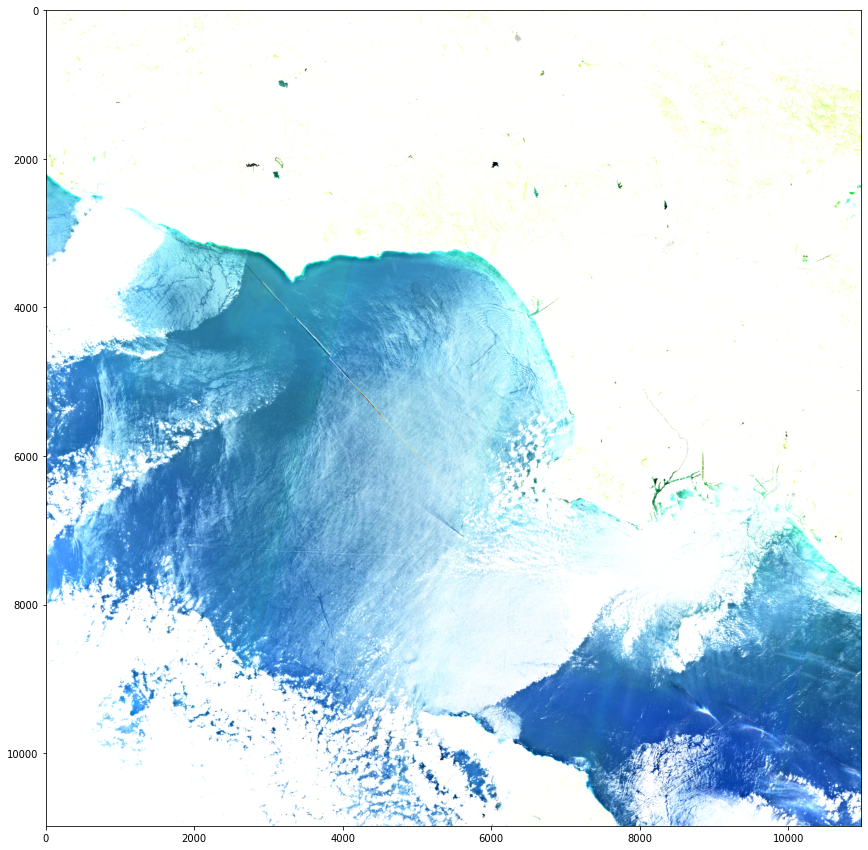

In [17]:
import matplotlib.pyplot as plt 
plt.figure(figsize = (15,15))
plt.imshow(RGB)

As you can see our image looks bad. We need to normalize our RGB bands as seen here: https://github.com/blaylockbk/pyBKB_v3/blob/master/BB_GOES/mapping_GOES16_FireTemperature.ipynb

In [18]:
# lets get the max and min values for each channel
print(f'Red Max: {R.max()}, Min {R.min()}')
print(f'Green Max: {G.max()}, Min {G.min()}')
print(f'Blue Max: {B.max()}, Min {B.min()}')

Red Max: 17136, Min 0
Green Max: 18032, Min 0
Blue Max: 19360, Min 0


In [19]:
# https://github.com/blaylockbk/pyBKB_v3/blob/master/BB_GOES/mapping_GOES16_FireTemperature.ipynb

#R,G,B = band4[0].values, band3[0].values, band2[0].values

# Normalize each channel by the appropriate range of values  e.g. R = (R-minimum)/(maximum-minimum)
R = (R-R.min())/(R.max()-R.min())
G = (G-G.min())/(G.max()-G.min())
B = (B-B.min())/(B.max()-B.min())

# Apply range limits for each channel. RGB values must be between 0 and 1
#R = np.clip(R, 0, 1)
#G = np.clip(G, 0, 255)
#B = np.clip(B, 0, 255)

# Apply the gamma correction to Red channel.
#   corrected_value = value^(1/gamma)
#gamma = 2.2
#R = np.power(R, 1/gamma)
#G = np.power(G, 1/gamma)
#B = np.power(B, 1/gamma)

In [20]:
print(f'Red Max: {R.max()}, Min {R.min()}')
print(f'Green Max: {G.max()}, Min {G.min()}')
print(f'Blue Max: {B.max()}, Min {B.min()}')

Red Max: 1.0, Min 0.0
Green Max: 1.0, Min 0.0
Blue Max: 1.0, Min 0.0


In [21]:
RGB = np.dstack((R, G, B))

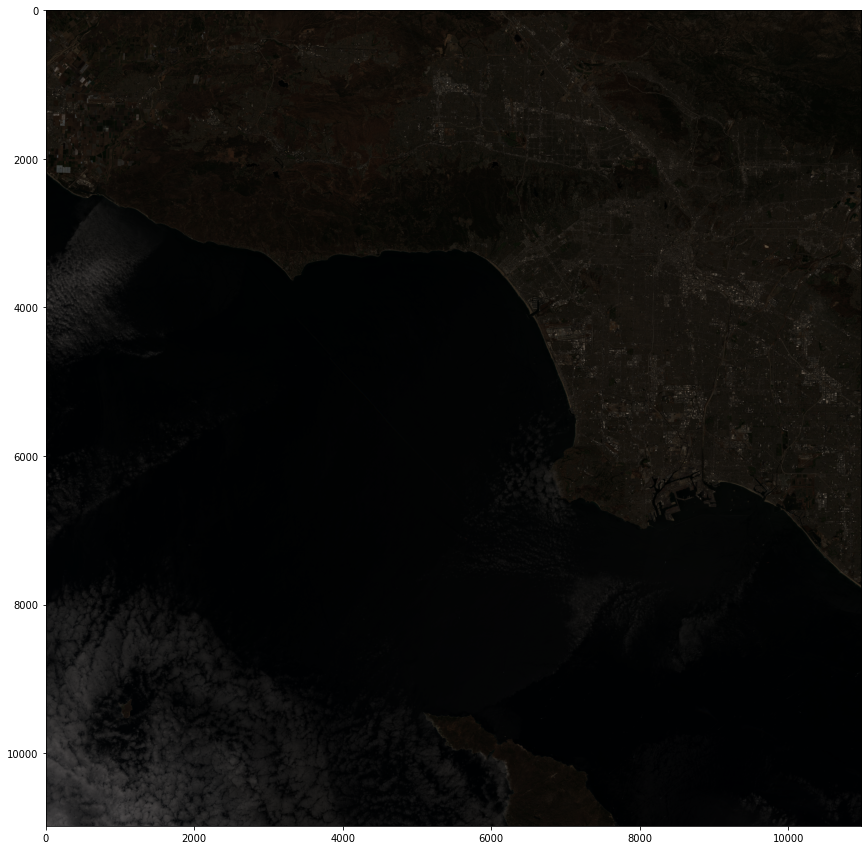

In [22]:
#uses alot of memory to plot this, not sure why it is so dark, lets take a look at another way
import matplotlib.pyplot as plt 
plt.figure(figsize = (15,15))
plt.imshow(RGB)

In [23]:
# some magic
# https://gis.stackexchange.com/questions/341809/merging-sentinel-2-rgb-bands-with-rasterio
from skimage import exposure
R,G,B = band4[0].values, band3[0].values, band2[0].values
RGB = np.dstack((R, G, B))
p2, p98 = np.percentile(RGB, (2,98))
image = exposure.rescale_intensity(RGB, in_range=(p2, p98)) / 100000

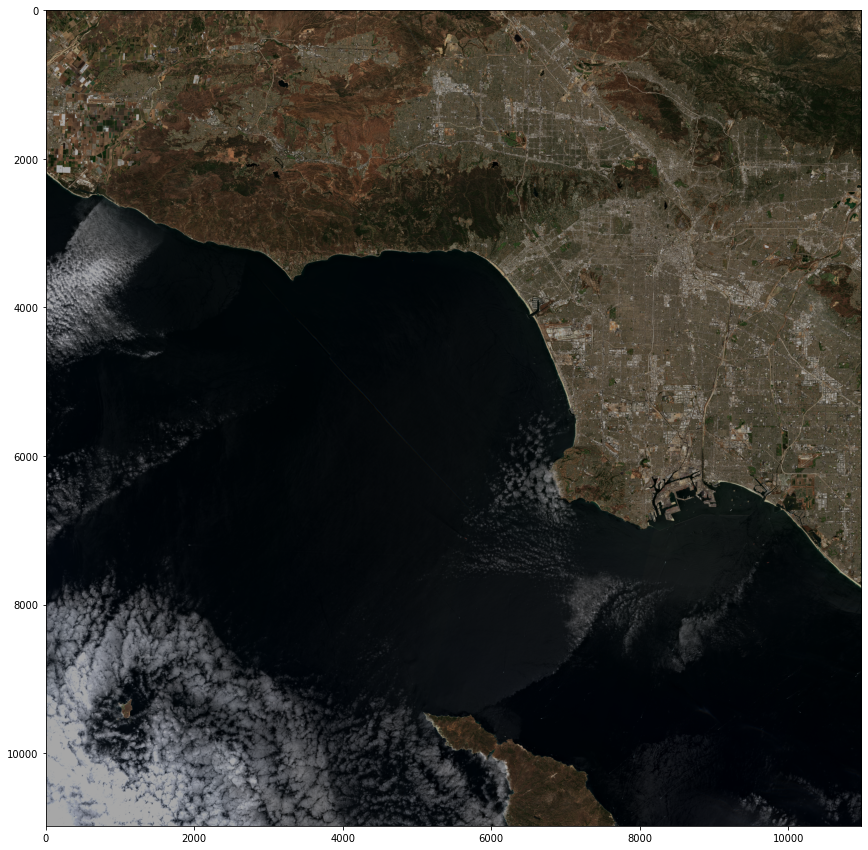

In [24]:
plt.figure(figsize = (15,15))
plt.imshow(image)

In [25]:
image.shape

(10980, 10980, 3)

Lets visualize our NIR band.

In [26]:
band8 = xr.open_rasterio(glob.glob('*2019*11SLT*.SAFE\GRANULE\L2A_*\IMG_DATA\R10m\*_B08_*.jp2')[0])

In [27]:
NIR = band8[0].values
print(f'Red Max: {NIR.max()}, Min {NIR.min()}')

Red Max: 16280, Min 0


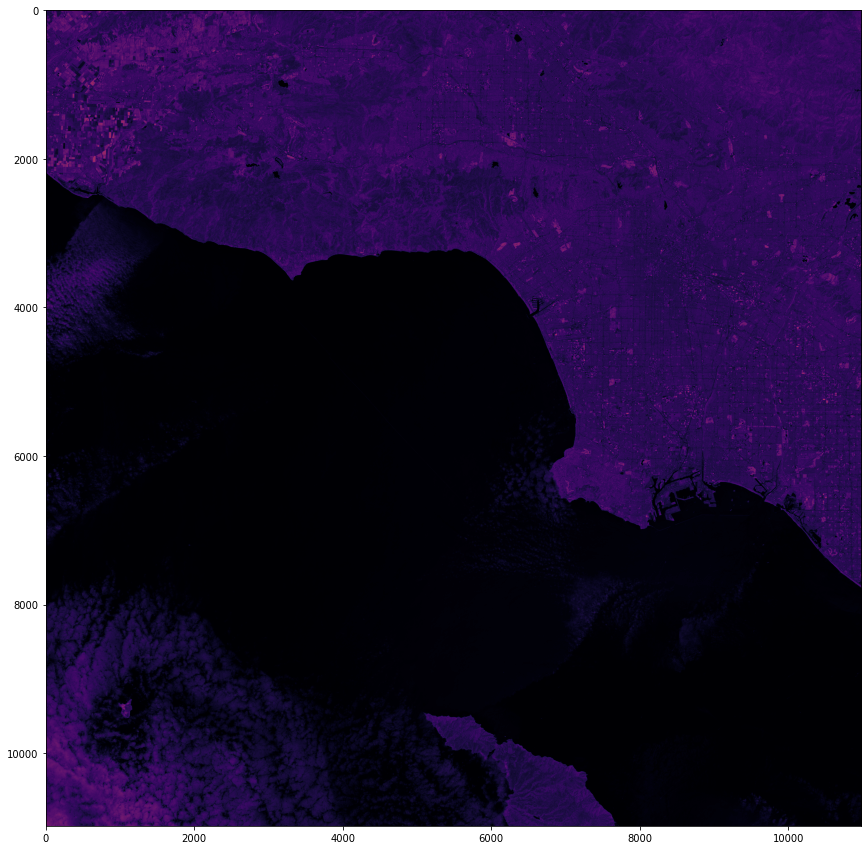

In [28]:
import matplotlib.pyplot as plt 
plt.figure(figsize = (15,15))
plt.imshow(NIR, cmap = 'inferno')

For demo purposes I will show a NIR image of the woolsey fire

In [32]:
band8_woolsey = xr.open_rasterio(r'F:\sentinel\11\S\LT\2018\11\11SLT201811100R10mB08.jp2')

In [33]:
NIR = band8_woolsey[0].values
print(f'Red Max: {NIR.max()}, Min {NIR.min()}')

Red Max: 16608, Min 1


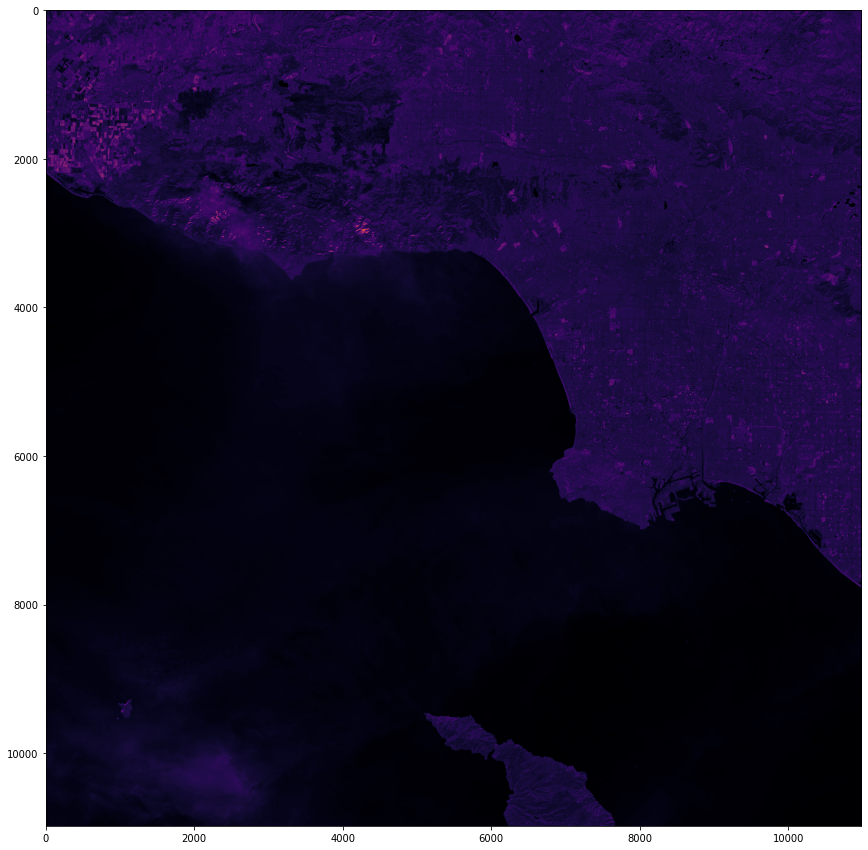

In [34]:
import matplotlib.pyplot as plt 
plt.figure(figsize = (15,15))
plt.imshow(NIR, cmap = 'inferno')

In [35]:
NIR = band8_woolsey[0].values
print(f'Red Max: {NIR.max()}, Min {NIR.min()}')
print(NIR.shape)
NIR = (NIR-NIR.min())/(NIR.max()-NIR.min())
print(f'Red Max: {NIR.max()}, Min {NIR.min()}')
print(NIR.shape)

Red Max: 16608, Min 1
(10980, 10980)
Red Max: 1.0, Min 0.0
(10980, 10980)


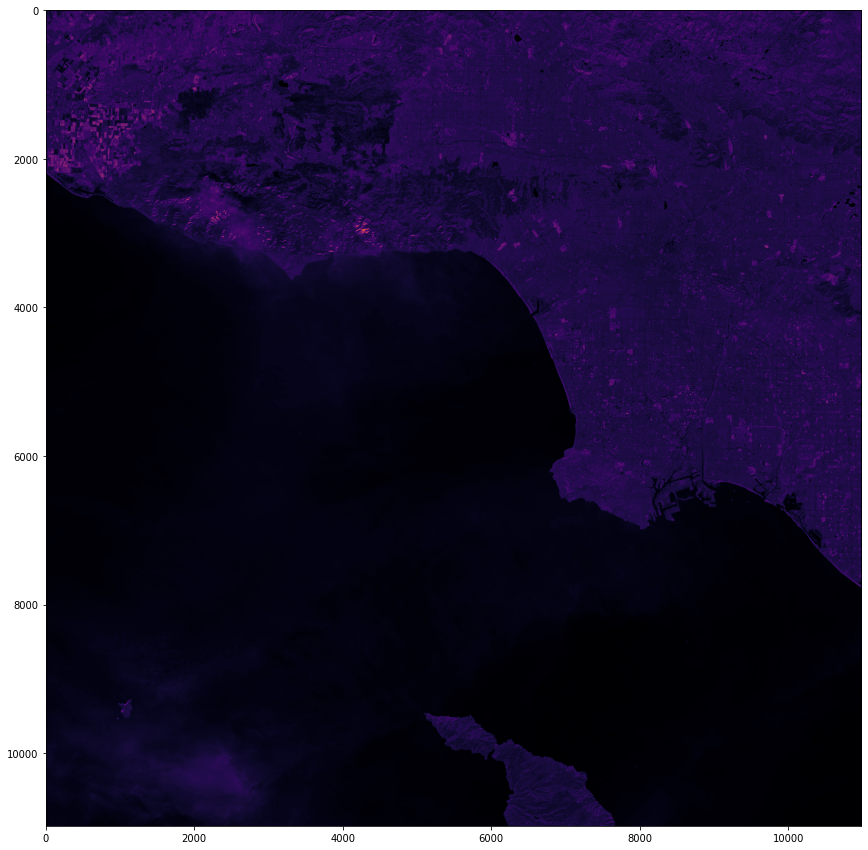

In [36]:
import matplotlib.pyplot as plt 
plt.figure(figsize = (15,15))
plt.imshow(NIR, cmap = 'inferno')

In [37]:
NIR = band8_woolsey[0].values
p2, p100 = np.percentile(NIR, (3,97))
image = exposure.rescale_intensity(NIR, in_range=(p2, p98)) / 100000

We can see part of the active fire, but also notice the mountainous area to the west is very brightly lit.

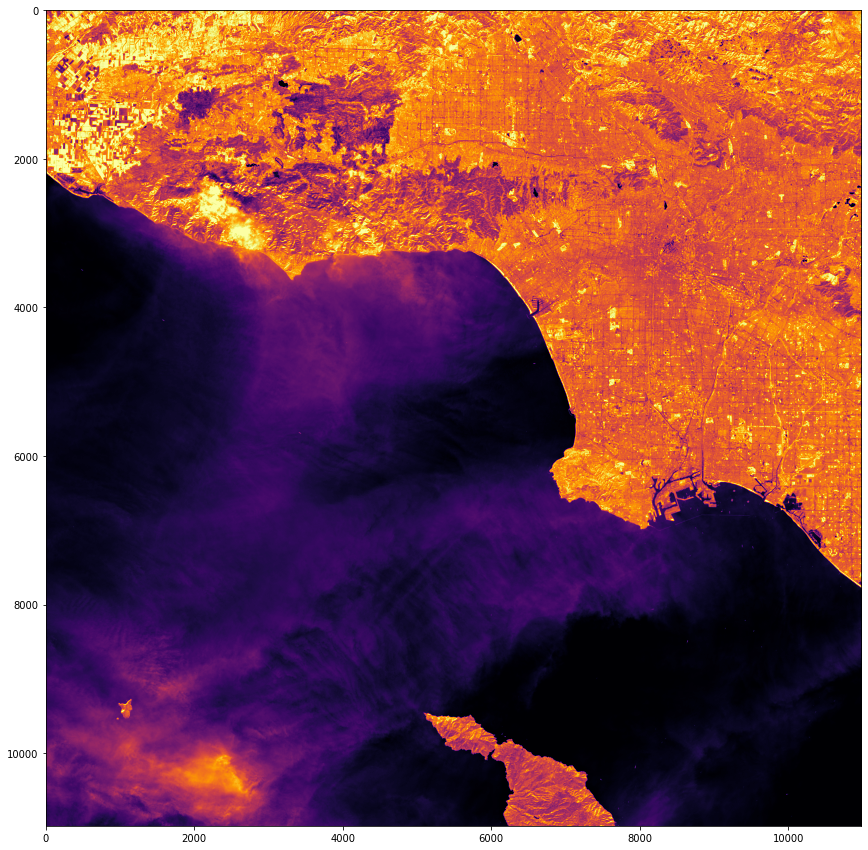

In [38]:
import matplotlib.pyplot as plt 
plt.figure(figsize = (15,15))
plt.imshow(image, cmap = 'inferno')

Lets compute and visualize NDVI with the earlier image scene, we will do this with the raw values. The formuala is (NIR - Red)/ (NIR + Red)

In [39]:
NIR = band8[0].values
R = band4[0].values

In [40]:
# allow divide by zore, also link below interesting
# https://developers.planet.com/planetschool/calculate-an-ndvi-in-python/
# http://patrickgray.me/open-geo-tutorial/chapter_2_indices.html
np.seterr(divide='ignore', invalid='ignore')
NDVI = (NIR.astype(float)-R.astype(float))/(NIR.astype(float)+R.astype(float))

In [41]:
print(f'NDVI Max: {NDVI.max()}, NDVI Min {NDVI.min()}')
print(NDVI.shape)

NDVI Max: nan, NDVI Min nan
(10980, 10980)


In [42]:
NDVI = np.nan_to_num(NDVI, nan=0, posinf=0, neginf=0)

In [43]:
print(f'NDVI Max: {NDVI.max()}, NDVI Min: {NDVI.min()}')
print(NDVI.shape)

NDVI Max: 1.0, NDVI Min: -1.0
(10980, 10980)


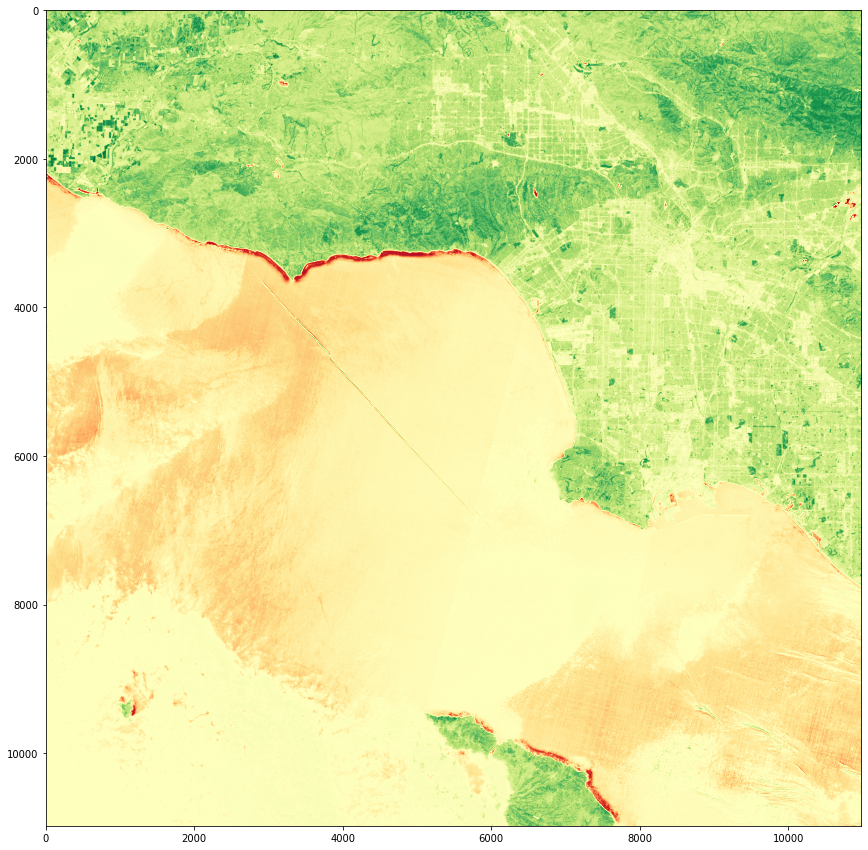

In [44]:
#might be better to look at a picture with less water
plt.figure(figsize = (15,15))
plt.imshow(NDVI, cmap = 'RdYlGn', vmin =-1, vmax =1)

In [45]:
#lets take a look at an area with more vegataion, like northern CA.

In [46]:
# gs://gcp-public-data-sentinel-2/L2/tiles/10/T/DK/S2B_MSIL2A_20190925T190119_N0213_R013_T10TDK_20190925T214017.SAFE
file = 'S2B_MSIL2A_20190925T190119_N0213_R013_T10TDK_20190925T214017.SAFE'
os.system(f'gsutil -m cp -r "gs://gcp-public-data-sentinel-2/L2/tiles/10/T/DK/{file}/" .')

0

In [47]:
L2A = glob.glob('*2019*10TDK*.SAFE\GRANULE\L2A_*\IMG_DATA\R10m\*_B*_*.jp2')
L2A

['S2B_MSIL2A_20190925T190119_N0213_R013_T10TDK_20190925T214017.SAFE\\GRANULE\\L2A_T10TDK_A013338_20190925T190458\\IMG_DATA\\R10m\\T10TDK_20190925T190119_B02_10m.jp2',
 'S2B_MSIL2A_20190925T190119_N0213_R013_T10TDK_20190925T214017.SAFE\\GRANULE\\L2A_T10TDK_A013338_20190925T190458\\IMG_DATA\\R10m\\T10TDK_20190925T190119_B03_10m.jp2',
 'S2B_MSIL2A_20190925T190119_N0213_R013_T10TDK_20190925T214017.SAFE\\GRANULE\\L2A_T10TDK_A013338_20190925T190458\\IMG_DATA\\R10m\\T10TDK_20190925T190119_B04_10m.jp2',
 'S2B_MSIL2A_20190925T190119_N0213_R013_T10TDK_20190925T214017.SAFE\\GRANULE\\L2A_T10TDK_A013338_20190925T190458\\IMG_DATA\\R10m\\T10TDK_20190925T190119_B08_10m.jp2']

In [48]:
B, G, R, NIR  = [xr.open_rasterio(L2A[band])[0].values for band in range(0,4)]

In [49]:
RGB = np.dstack((R, G, B))
p2, p98 = np.percentile(RGB, (2,98))
image = exposure.rescale_intensity(RGB, in_range=(p2, p98)) / 100000

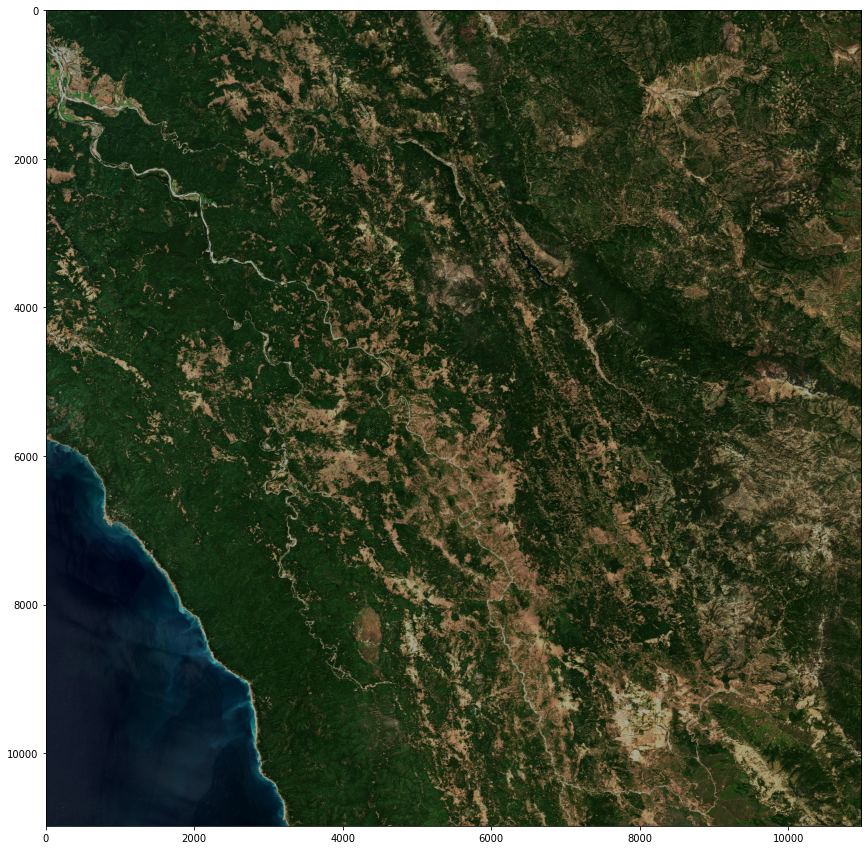

In [50]:
plt.figure(figsize = (15,15))
plt.imshow(image)

In [51]:
# allow divide by zore, also link below interesting
# https://developers.planet.com/planetschool/calculate-an-ndvi-in-python/
# http://patrickgray.me/open-geo-tutorial/chapter_2_indices.html
np.seterr(divide='ignore', invalid='ignore')
NDVI = (NIR.astype(float)-R.astype(float))/(NIR.astype(float)+R.astype(float))

In [52]:
print(f'NDVI Max: {NDVI.max()}, NDVI Min {NDVI.min()}')
print(NDVI.shape)

NDVI Max: nan, NDVI Min nan
(10980, 10980)


In [53]:
NDVI = np.nan_to_num(NDVI, nan=0, posinf=0, neginf=0)

In [54]:
print(f'NDVI Max: {NDVI.max()}, NDVI Min: {NDVI.min()}')
print(NDVI.shape)

NDVI Max: 1.0, NDVI Min: -1.0
(10980, 10980)


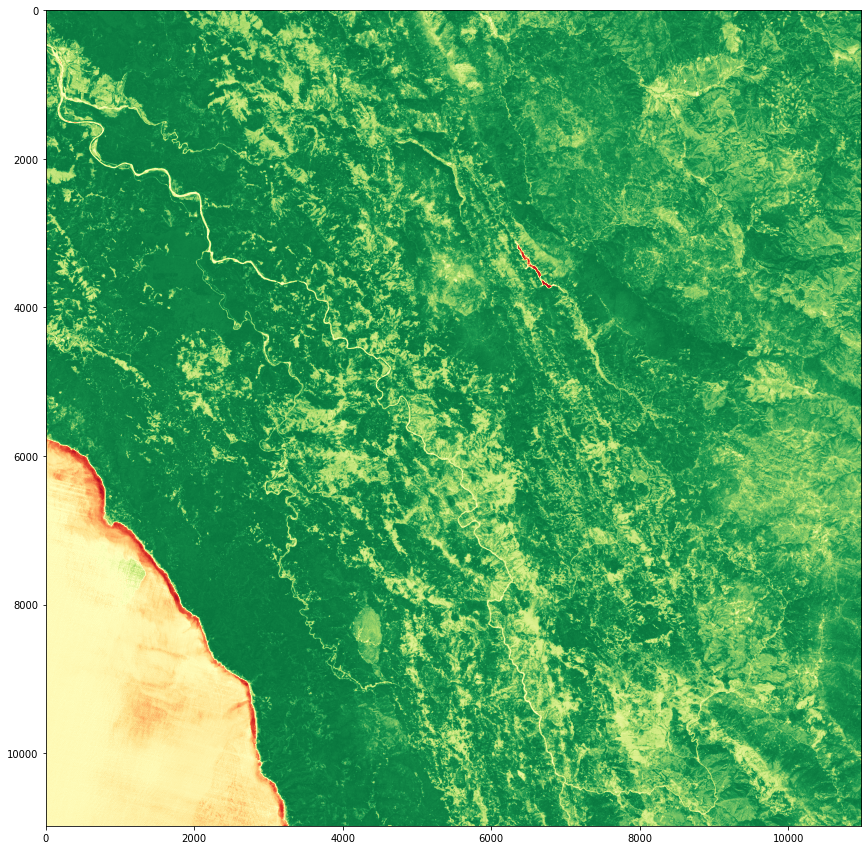

In [55]:
#might be better to look at a picture with less water
plt.figure(figsize = (15,15))
plt.imshow(NDVI, cmap = 'RdYlGn', vmin =-1, vmax =1)

### Processing L1C Image Scenes

Earlier we viewed an image scene that was concsidered an L2A product, meaning it was atmospherically corrected to BOA. Unfortunatly, the L2A data starts in 2017, so we have an additional preprocessing step for the image scenes from 2015-2017. Below I will demostrate how we can do this with Sen2Cor.

In [2]:
# gs://gcp-public-data-sentinel-2/tiles/10/S/FG/S2A_MSIL1C_20150918T190346_N0204_R113_T10SFG_20150918T190345.SAFE
file = 'S2A_MSIL1C_20150918T190346_N0204_R113_T10SFG_20150918T190345.SAFE'
os.system(f'gsutil -m cp -r "gs://gcp-public-data-sentinel-2/tiles/10/S/FG/{file}/" .')

In [4]:
#need to make these four directories otherwise program will fail
make_dir_path = glob.glob(f'./{file}/GRANULE/L1C*/')[0]
os.mkdir(f'{file}/HTML')
os.mkdir(f'{file}/AUX_DATA')
os.mkdir(f'{make_dir_path}/HTML')
os.mkdir(f'{make_dir_path}/AUX_DATA')

In [4]:
os.system(f'.\Sen2Cor-02.05.05-win64\L2A_Process.bat "./{file}"')

Now that we have atmospherically corrected our image scene, let's visualize it to see if we notice any differences.

In [5]:
L1C = glob.glob(f'./{file}/GRANULE/L1C*/IMG_DATA/*_B0[2-4]*') #regex
L1C

['./S2A_MSIL1C_20150918T190346_N0204_R113_T10SFG_20150918T190345.SAFE/GRANULE\\L1C_T10SFG_A001254_20150918T190345\\IMG_DATA\\T10SFG_20150918T190346_B02.jp2',
 './S2A_MSIL1C_20150918T190346_N0204_R113_T10SFG_20150918T190345.SAFE/GRANULE\\L1C_T10SFG_A001254_20150918T190345\\IMG_DATA\\T10SFG_20150918T190346_B03.jp2',
 './S2A_MSIL1C_20150918T190346_N0204_R113_T10SFG_20150918T190345.SAFE/GRANULE\\L1C_T10SFG_A001254_20150918T190345\\IMG_DATA\\T10SFG_20150918T190346_B04.jp2']

In [6]:
L2A = glob.glob('*2015*.SAFE\GRANULE\L2A_*\IMG_DATA\R10m\*_B*_*.jp2')
L2A

['S2A_MSIL2A_20150918T190346_N0204_R113_T10SFG_20150918T190345.SAFE\\GRANULE\\L2A_T10SFG_A001254_20150918T190345\\IMG_DATA\\R10m\\L2A_T10SFG_20150918T190346_B02_10m.jp2',
 'S2A_MSIL2A_20150918T190346_N0204_R113_T10SFG_20150918T190345.SAFE\\GRANULE\\L2A_T10SFG_A001254_20150918T190345\\IMG_DATA\\R10m\\L2A_T10SFG_20150918T190346_B03_10m.jp2',
 'S2A_MSIL2A_20150918T190346_N0204_R113_T10SFG_20150918T190345.SAFE\\GRANULE\\L2A_T10SFG_A001254_20150918T190345\\IMG_DATA\\R10m\\L2A_T10SFG_20150918T190346_B04_10m.jp2',
 'S2A_MSIL2A_20150918T190346_N0204_R113_T10SFG_20150918T190345.SAFE\\GRANULE\\L2A_T10SFG_A001254_20150918T190345\\IMG_DATA\\R10m\\L2A_T10SFG_20150918T190346_B08_10m.jp2']

In [7]:
L1C_Blue, L1C_Green, L1C_Red  = [xr.open_rasterio(L1C[band])[0].values for band in range(0,3)]

In [8]:
L2A_Blue, L2A_Green, L2A_Red  = [xr.open_rasterio(L2A[band])[0].values for band in range(0,3)]

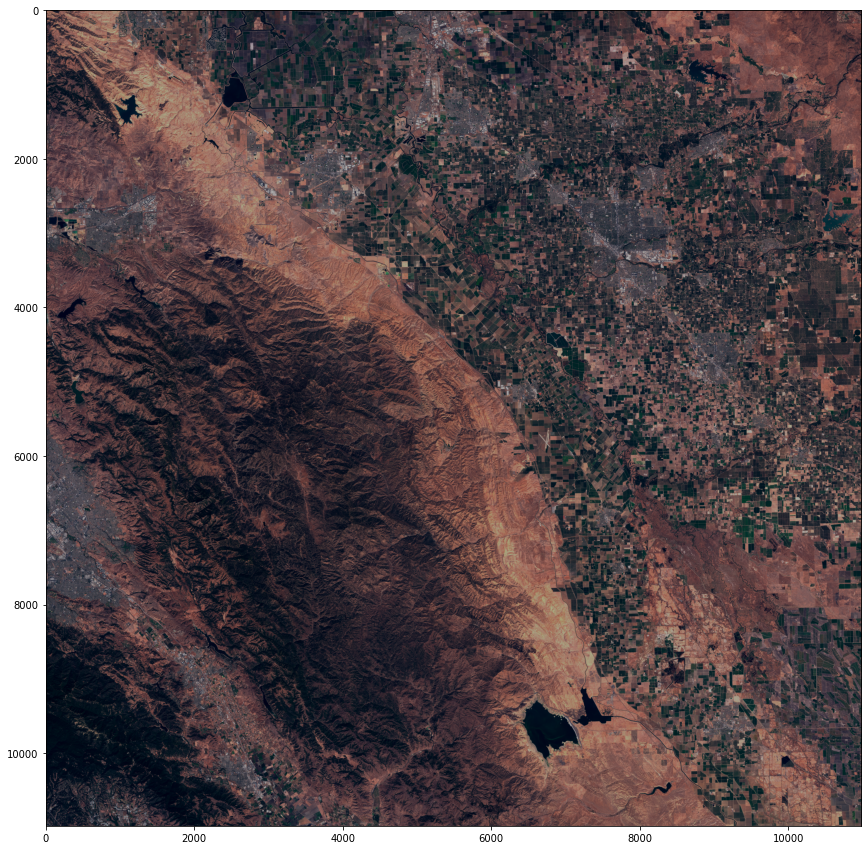

In [9]:
L1C_RGB = np.dstack((L1C_Red, L1C_Green, L1C_Blue))
p2, p98 = np.percentile(L1C_RGB, (2,98))
image = exposure.rescale_intensity(L1C_RGB, in_range=(p2, p98)) / 100000
plt.figure(figsize = (15,15))
plt.imshow(image)

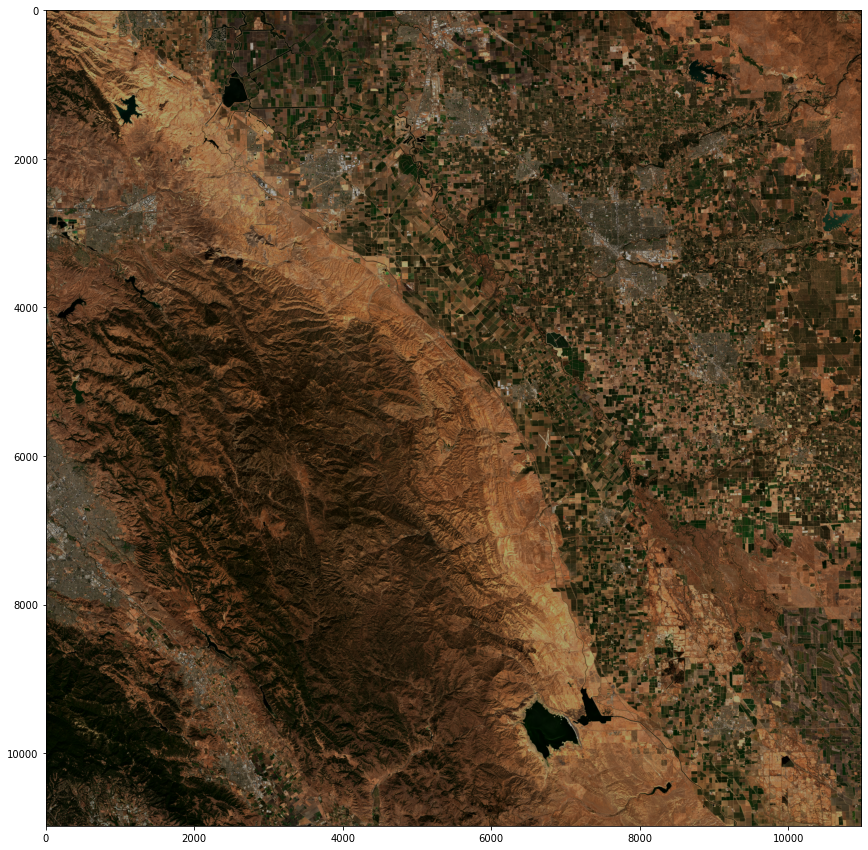

In [10]:
L2A_RGB = np.dstack((L2A_Red, L2A_Green, L2A_Blue))
p2, p98 = np.percentile(L2A_RGB, (2,98))
image = exposure.rescale_intensity(L2A_RGB, in_range=(p2, p98)) / 100000
plt.figure(figsize = (15,15))
plt.imshow(image)

At this time, we have our processed data and we can decide what we want to save or how we want to save it. Exploring through the directory we need to come to a consensus about what image bands are most important. Should we we keep Red, Green, Blue, NIR and our NDVI calc? Or shoudl we just keep our NIR and NDVI? Do we want to find a way to crop our image where a fire is located? This will reduce the size of each image, in addition if our goal is to predict the path a fire will take, more preprocessing will be necessary, we will want to only feed fire features to our neural network.

Some resources to better emphasize our wild fires
- https://communities.geoplatform.gov/disasters/california-wildfires-remote-sensing-with-sentinel-2-imagery/
- https://workshop.copernicus.eu/sites/default/files/content/attachments/b.mccormack.pdf
- https://pierre-markuse.net/2017/08/07/visualizing-wildfires-sentinel-2-imagery-eo-browser/
- https://www.sciencedirect.com/science/article/pii/S0303243421000544

Note about 3, although in javascript, the formulas are what are important

We can save our arrays in .npy format or compressed .npy format, a compressed format will add additional
compute overhead but mighht be worth the additional compute overhead, based on what I am reading hdf5 might be the best way.

In [11]:
np.save('L1C_Blue.npy', L1C_Blue)

In [12]:
np.savez('L1C_combined', L1C_Blue, L1C_Green,L1C_Red)

In [13]:
np.save('image.npy', image)

In [14]:
B = (L1C_Blue-L1C_Blue.min())/(L1C_Blue.max()-L1C_Blue.min())

In [15]:
np.save('B.npy', B)

In [16]:
import h5py

In [17]:
f1 = h5py.File("data.hdf5", "w")

In [18]:
dset1 = f1.create_dataset("dataset_01", data=L1C_Blue)

In [19]:
f1.close()